<font size=7> Phase Locking Main Figure

In [43]:
from human_hip import spike_data
import numpy as np
from human_hip.spike_data import *
import pickle

import matplotlib.pyplot as plt
import matplotlib.cm as cm


# <font color="magenta"> HC112823 - Seizure

## <font color="magenta"> get data

In [101]:
sd = read_autocurated_data( "/workspaces/human_hippocampus/data/ephys/2023-12-03-e-Hc112823_avv9hckcr1/derived/kilosort2/Hc112823_avv9hckcr1_21841_120323_3_acqm.zip" )


In [102]:
with open( "2023-12-03-e-Hc112823_avv9hckcr1_acid1_theta_spike_locking_s.pkl", 'rb') as file:
    data = pickle.load(file)
    
data.keys()

dict_keys(['rayleigh_p', 'mean_angle'])

In [103]:
#data
data["mean_angle"].shape

(212,)

(array([57., 21., 19., 12., 11.,  6.,  4.,  8.,  8.,  5.,  4.,  5.,  4.,
         2.,  2.,  3.,  2.,  5.,  4.,  3.,  2.,  2.,  5.,  3.,  2.,  3.,
         3.,  2.,  2.,  3.]),
 array([1.26736367e-12, 3.32240574e-02, 6.64481148e-02, 9.96721722e-02,
        1.32896230e-01, 1.66120287e-01, 1.99344344e-01, 2.32568402e-01,
        2.65792459e-01, 2.99016517e-01, 3.32240574e-01, 3.65464632e-01,
        3.98688689e-01, 4.31912746e-01, 4.65136804e-01, 4.98360861e-01,
        5.31584919e-01, 5.64808976e-01, 5.98033033e-01, 6.31257091e-01,
        6.64481148e-01, 6.97705206e-01, 7.30929263e-01, 7.64153321e-01,
        7.97377378e-01, 8.30601435e-01, 8.63825493e-01, 8.97049550e-01,
        9.30273608e-01, 9.63497665e-01, 9.96721722e-01]),
 <BarContainer object of 30 artists>)

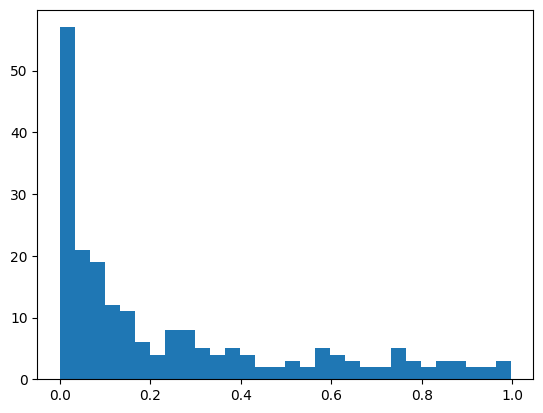

In [104]:
plt.hist( data['rayleigh_p'], bins=30 )

(array([ 5.,  2.,  6.,  6.,  8.,  1., 11., 12.,  8., 16., 19., 13., 14.,
        12., 13., 15.,  5.,  5.,  8.,  3.,  1.,  4.,  3.,  4.,  3.,  4.,
         2.,  1.,  0.,  8.]),
 array([-3.06843433, -2.86334304, -2.65825175, -2.45316047, -2.24806918,
        -2.04297789, -1.8378866 , -1.63279531, -1.42770403, -1.22261274,
        -1.01752145, -0.81243016, -0.60733887, -0.40224759, -0.1971563 ,
         0.00793499,  0.21302628,  0.41811757,  0.62320885,  0.82830014,
         1.03339143,  1.23848272,  1.44357401,  1.64866529,  1.85375658,
         2.05884787,  2.26393916,  2.46903044,  2.67412173,  2.87921302,
         3.08430431]),
 <BarContainer object of 30 artists>)

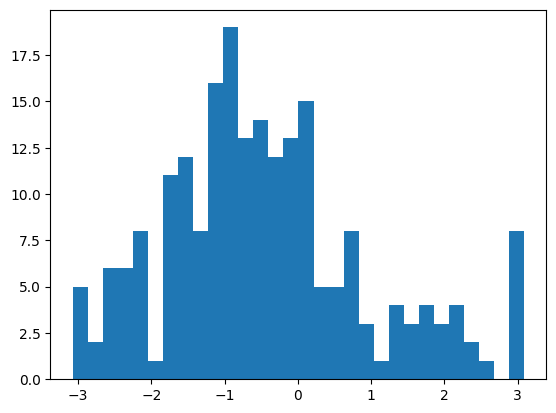

In [105]:
plt.hist( data['mean_angle'], bins=30 )

In [107]:
#max(angles)
#min(angles)

## <font color="magenta"> make plot

In [108]:
angles = data["mean_angle"]
pvals = data["rayleigh_p"]

In [109]:
# get xy locations
neuron_x = []
neuron_y = []
for key,val in sd.neuron_data[0].items():
    neuron_x.append( val["position"][0] )
    neuron_y.append( val["position"][1] )
neuron_x = np.array(neuron_x)
neuron_y = np.array(neuron_y)

/tmp/ipykernel_13148/4009571218.py:4: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


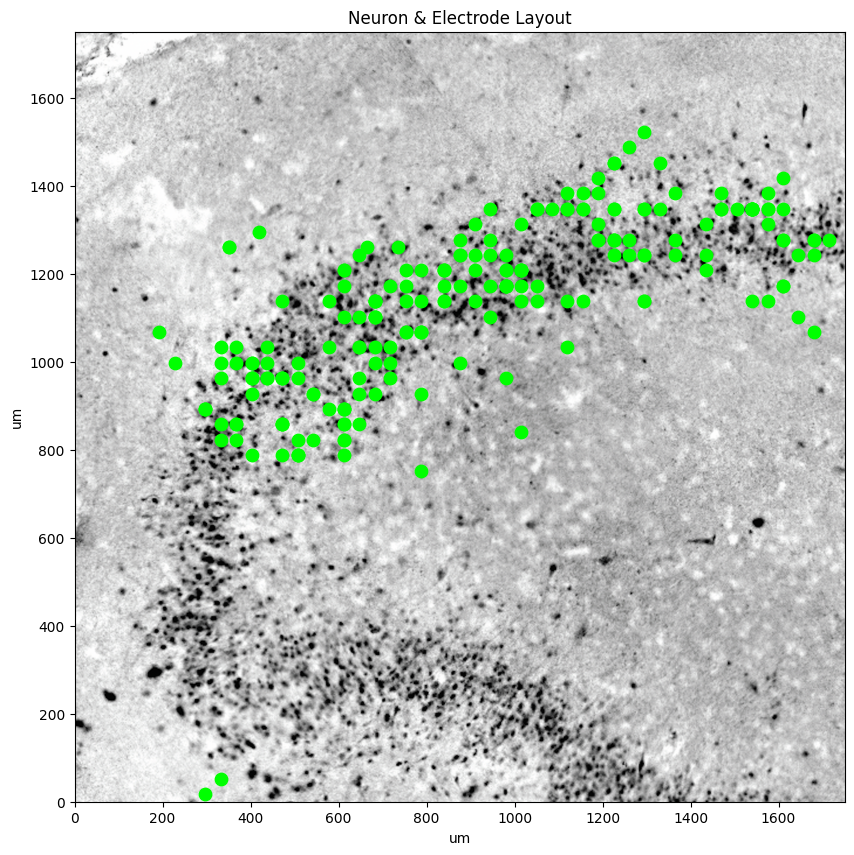

In [110]:
# Add background image
plt.figure(figsize=(15,10))       # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

plt.scatter( neuron_x, neuron_y,  c="lime", alpha=1, s=80 )  

plt.xlim( 0, 1750 )                                       # Set axis limits to that of the MEA
plt.ylim( 0, 1750 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout")
plt.show()  

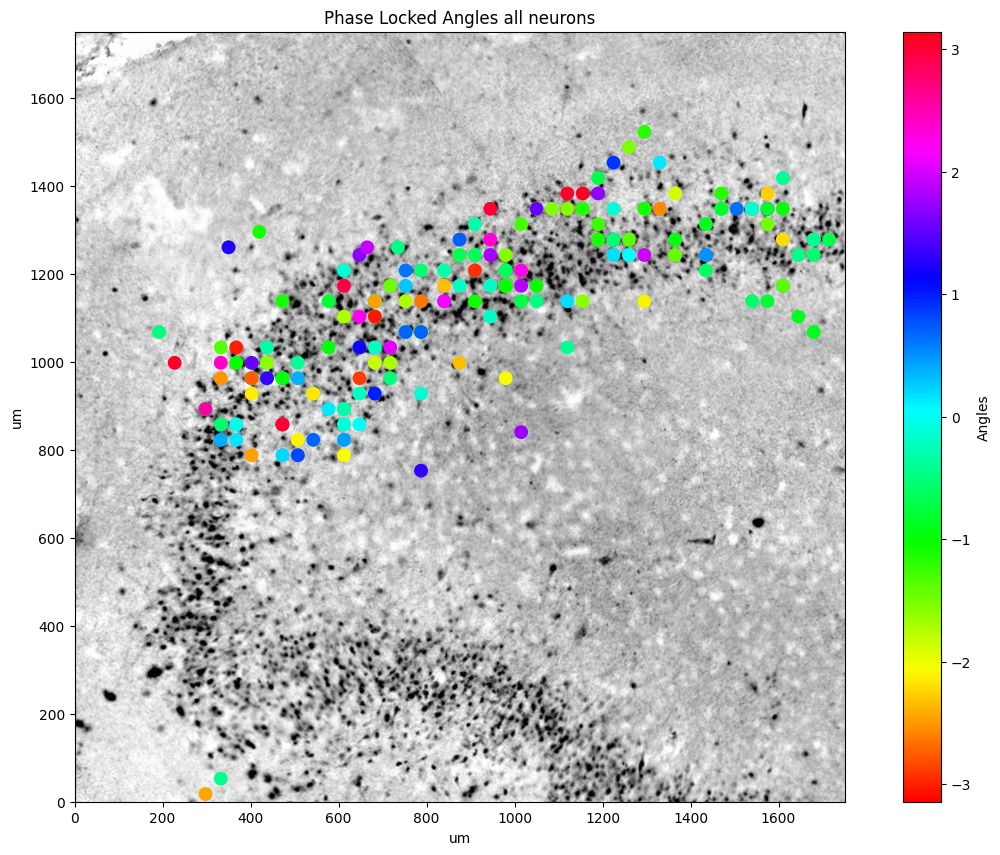

In [111]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Assuming `neuron_x`, `neuron_y`, and `angles` are already defined arrays

# Add background image
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter(neuron_x, neuron_y, c=angles, cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles all neurons")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles
plt.show()

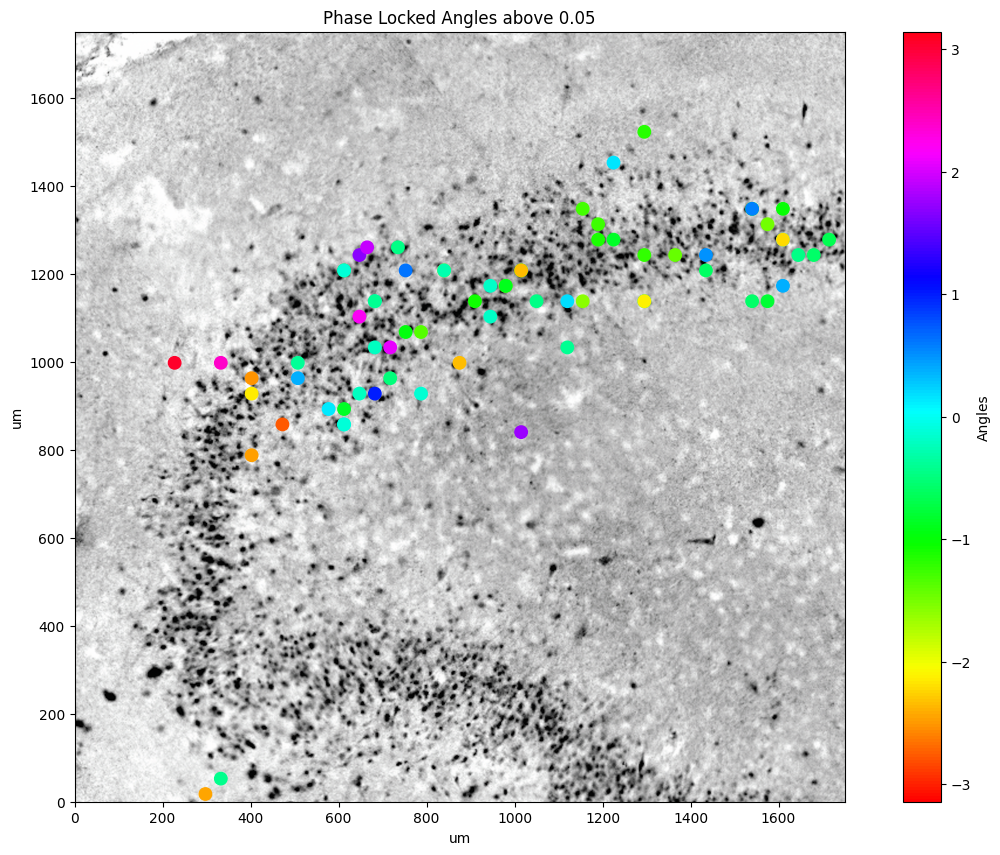

In [94]:

# Assuming `neuron_x`, `neuron_y`, and `angles` are already defined arrays

# Add background image
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter(neuron_x[pvals<0.05], neuron_y[pvals<0.05], c=angles[pvals<0.05], cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles
plt.show()

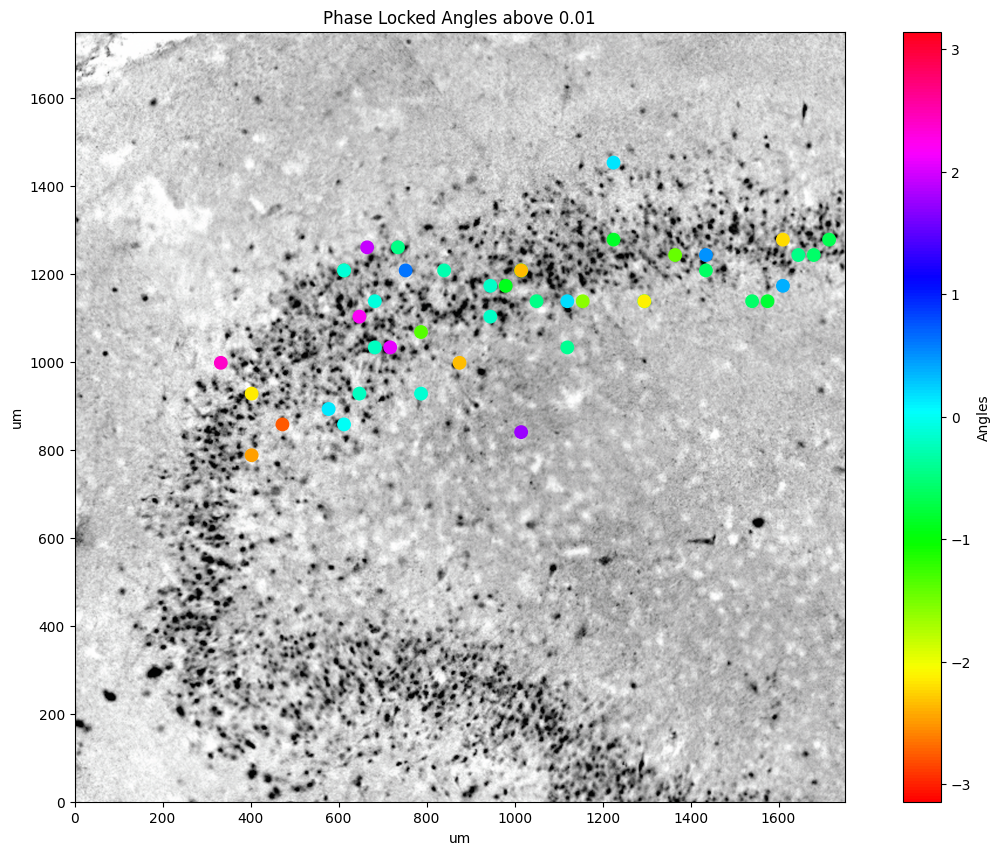

In [95]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter(neuron_x[pvals<0.01], neuron_y[pvals<0.01], c=angles[pvals<0.01], cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.01")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles
plt.show()

/tmp/ipykernel_13148/2166011731.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('hsv')


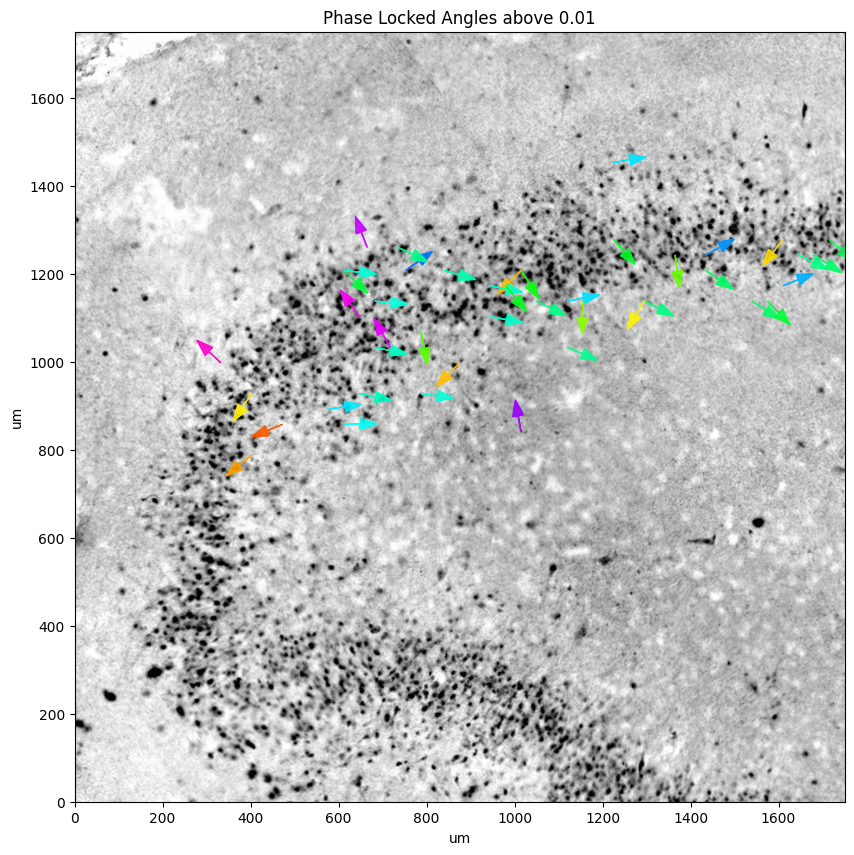

In [100]:
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions
cmap = cm.get_cmap('hsv')

# Scatter plot with colors based on `angles` using the `Spectral` colormap
final_x=neuron_x[pvals<0.01]
final_y= neuron_y[pvals<0.01]
final_angles= angles[pvals<0.01]


for i in range(len(final_x)):
        angle2 = (final_angles[i]+ np.pi)/np.pi/2
        arrow = FancyArrow( 
                final_x[i], final_y[i], np.cos(final_angles[i])*75 , np.sin(final_angles[i])*75, length_includes_head=True, head_width=25,
                linewidth=1, color=cmap(angle2,alpha=1)  ) #color="red"
        plt.gca().add_patch(arrow)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.01")
#plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles
plt.show()

# <font color="peru"> HC112823 - Non Seizure

## <font color="peru"> get data

In [117]:
sd = read_autocurated_data( "/workspaces/human_hippocampus/data/ephys/2023-12-03-e-Hc112823_avv9hckcr1/derived/kilosort2/Hc112823_avv9hckcr1_21841_120323_3_acqm.zip" )


In [118]:
with open( "2023-12-03-e-Hc112823_avv9hckcr1_acid1_theta_spike_locking_ns.pkl", 'rb') as file:
    data = pickle.load(file)
    
data.keys()

dict_keys(['rayleigh_p', 'mean_angle'])

In [119]:
#data
data["mean_angle"].shape

(212,)

(array([ 7., 12.,  7., 11., 11.,  5.,  5.,  6.,  5.,  1.,  2.,  5.,  3.,
         5.,  7., 10.,  8.,  2.,  5., 10.,  5.,  9.,  7.,  9.,  5.,  6.,
         9.,  5.,  8.,  6.]),
 array([9.05704217e-06, 3.32729663e-02, 6.65368755e-02, 9.98007847e-02,
        1.33064694e-01, 1.66328603e-01, 1.99592512e-01, 2.32856422e-01,
        2.66120331e-01, 2.99384240e-01, 3.32648149e-01, 3.65912059e-01,
        3.99175968e-01, 4.32439877e-01, 4.65703786e-01, 4.98967695e-01,
        5.32231605e-01, 5.65495514e-01, 5.98759423e-01, 6.32023332e-01,
        6.65287242e-01, 6.98551151e-01, 7.31815060e-01, 7.65078969e-01,
        7.98342878e-01, 8.31606788e-01, 8.64870697e-01, 8.98134606e-01,
        9.31398515e-01, 9.64662425e-01, 9.97926334e-01]),
 <BarContainer object of 30 artists>)

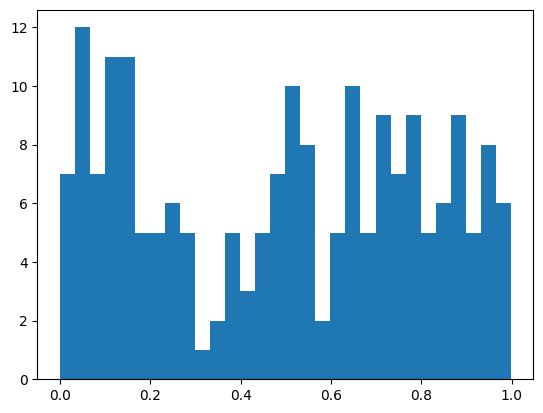

In [120]:
plt.hist( data['rayleigh_p'], bins=30 )

(array([ 6.,  3.,  6.,  3.,  1.,  9.,  3.,  5.,  7.,  7., 10.,  7.,  7.,
         8.,  9., 11., 12.,  6.,  6., 10., 10.,  7.,  6.,  5.,  4.,  5.,
         7.,  7.,  1.,  8.]),
 array([-3.07785903, -2.87621008, -2.67456114, -2.47291219, -2.27126325,
        -2.0696143 , -1.86796536, -1.66631641, -1.46466747, -1.26301852,
        -1.06136958, -0.85972063, -0.65807168, -0.45642274, -0.25477379,
        -0.05312485,  0.1485241 ,  0.35017304,  0.55182199,  0.75347093,
         0.95511988,  1.15676882,  1.35841777,  1.56006671,  1.76171566,
         1.9633646 ,  2.16501355,  2.3666625 ,  2.56831144,  2.76996039,
         2.97160933]),
 <BarContainer object of 30 artists>)

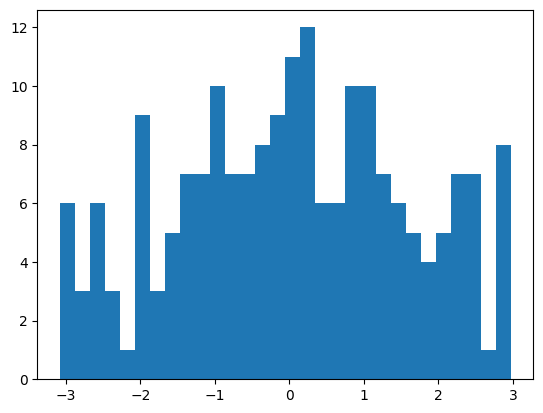

In [121]:
plt.hist( data['mean_angle'], bins=30 )

## <font color="peru"> make plot

In [122]:
angles = data["mean_angle"]
pvals = data["rayleigh_p"]

In [123]:
# get xy locations
neuron_x = []
neuron_y = []
for key,val in sd.neuron_data[0].items():
    neuron_x.append( val["position"][0] )
    neuron_y.append( val["position"][1] )
neuron_x = np.array(neuron_x)
neuron_y = np.array(neuron_y)

/tmp/ipykernel_13148/4009571218.py:4: DeprecationWarning: Call to deprecated function (or staticmethod) neuron_data. (Use NeuronAttributes instead of neuron_data, with the function load_spike_data())
  for key,val in sd.neuron_data[0].items():


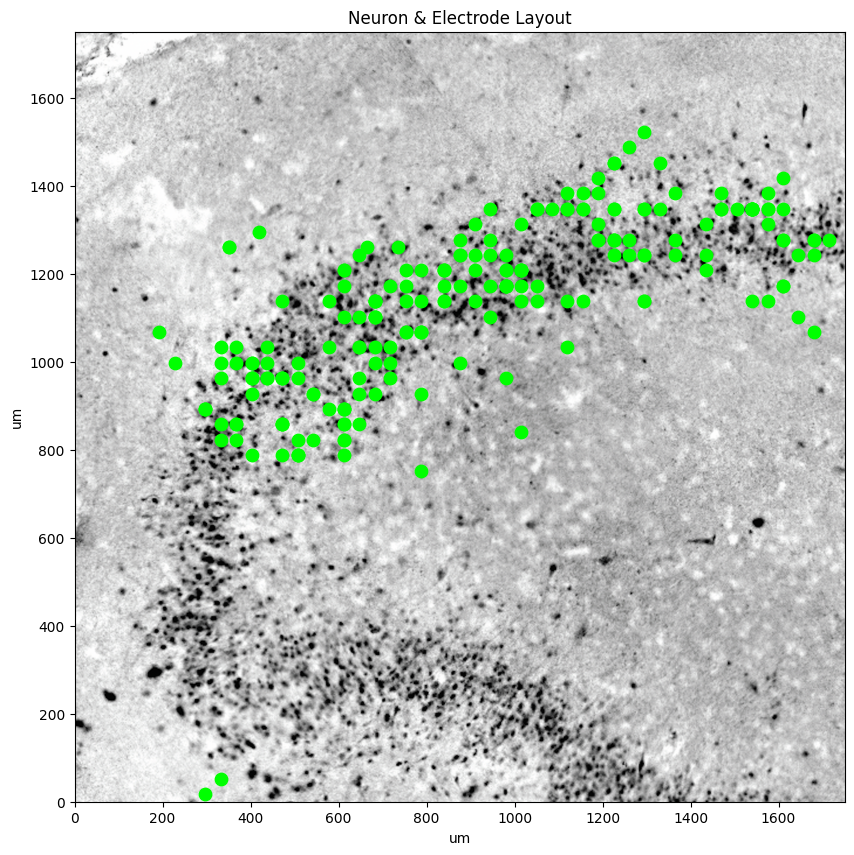

In [124]:
# Add background image
plt.figure(figsize=(15,10))       # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")      # Load in image
plt.imshow(img,  extent=[0, 3850, 0, 2100]) # Plot image, have it correspond to electrode dimensions

plt.scatter( neuron_x, neuron_y,  c="lime", alpha=1, s=80 )  

plt.xlim( 0, 1750 )                                       # Set axis limits to that of the MEA
plt.ylim( 0, 1750 )
plt.xlabel('um')                                         # add axises and title
plt.ylabel('um')
plt.title(f"Neuron & Electrode Layout")
plt.show()  

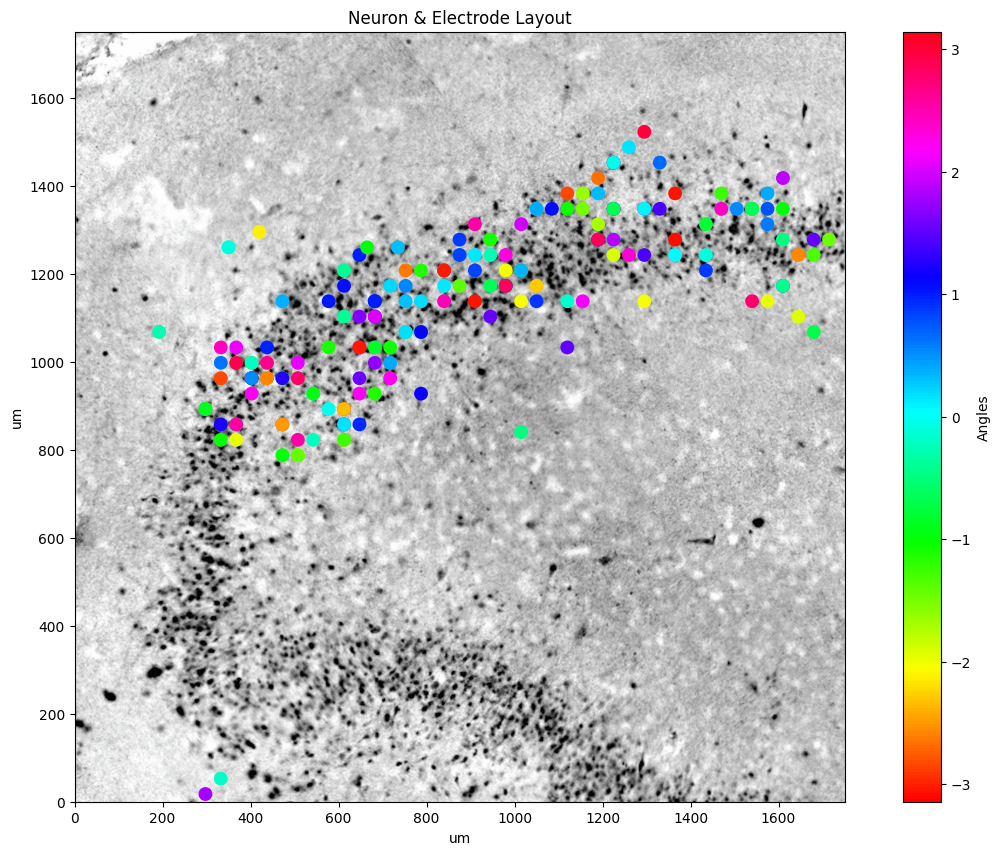

In [125]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Assuming `neuron_x`, `neuron_y`, and `angles` are already defined arrays

# Add background image
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter(neuron_x, neuron_y, c=angles, cmap='hsv', alpha=1, s=80,  vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Neuron & Electrode Layout")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles
plt.show()

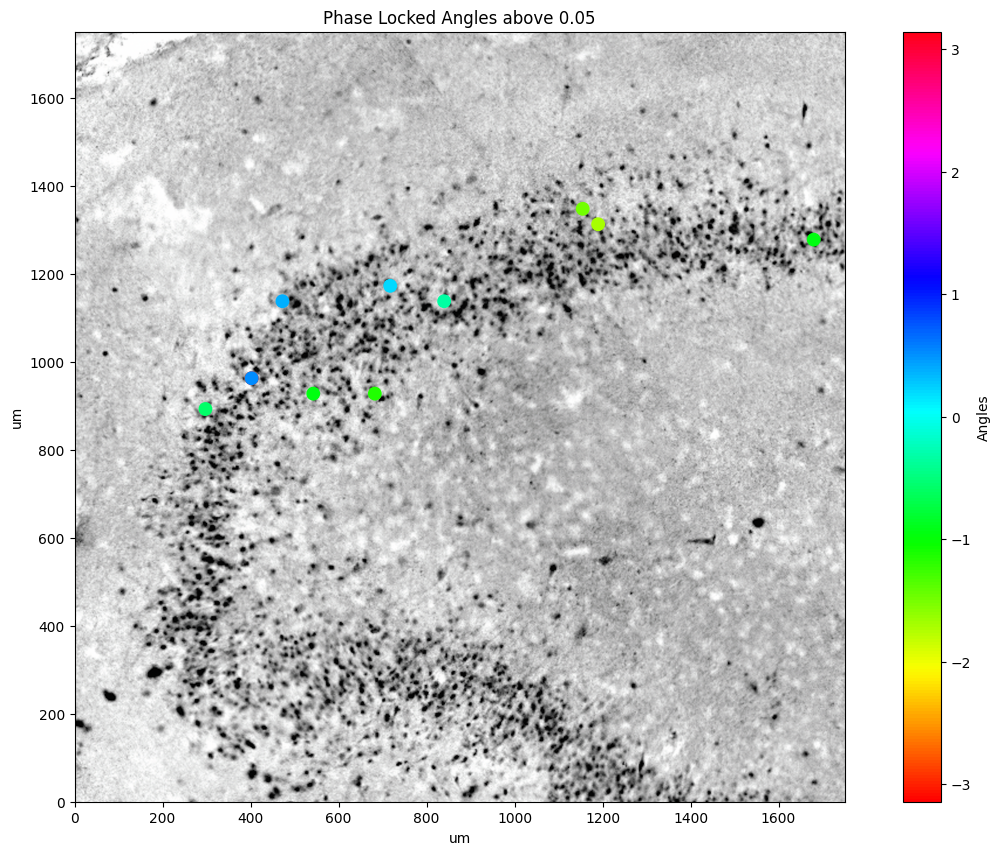

In [126]:

# Assuming `neuron_x`, `neuron_y`, and `angles` are already defined arrays

# Add background image
plt.figure(figsize=(15,10))  # Set image size to roughly the shape of the MEA
img = plt.imread("/workspaces/human_hippocampus/data/histology/hc112823_bw.png")  # Load in image
plt.imshow(img, extent=[0, 3850, 0, 2100])  # Plot image, have it correspond to electrode dimensions

# Scatter plot with colors based on `angles` using the `Spectral` colormap
plt.scatter(neuron_x[pvals<0.05], neuron_y[pvals<0.05], c=angles[pvals<0.05], cmap='hsv', alpha=1, s=80, vmin=-3.1416, vmax=3.1416)

plt.xlim(0, 1750)  # Set axis limits to that of the MEA
plt.ylim(0, 1750)
plt.xlabel('um')  # add axises and title
plt.ylabel('um')
plt.title("Phase Locked Angles above 0.05")
plt.colorbar(label='Angles')  # Add a colorbar to show the mapping of colors to angles
plt.show()